# Code for Figure 1 and corresponding supplementary figures

The example cell segmentations and images from Fig. 1b can be found in the figure_S7 notebook.

In [1]:
from data import PlateDataset

import torch
import numpy as np
import pandas as pd
from tqdm import trange, tqdm
import matplotlib.pyplot as plt
import torchvision.transforms as T 
import seaborn as sns
import umap


device = 'cuda:0'

In [2]:
data = PlateDataset([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], load_masks=True)

  0%|          | 0/16 [00:00<?, ?it/s]

  6%|▋         | 1/16 [00:05<01:18,  5.26s/it]

 12%|█▎        | 2/16 [00:11<01:22,  5.92s/it]

 19%|█▉        | 3/16 [00:12<00:49,  3.77s/it]

 25%|██▌       | 4/16 [00:16<00:44,  3.73s/it]

 31%|███▏      | 5/16 [00:17<00:32,  2.92s/it]

 38%|███▊      | 6/16 [00:19<00:23,  2.38s/it]

 44%|████▍     | 7/16 [00:22<00:23,  2.60s/it]

 50%|█████     | 8/16 [00:22<00:15,  1.94s/it]

 56%|█████▋    | 9/16 [00:23<00:10,  1.46s/it]

 62%|██████▎   | 10/16 [00:23<00:06,  1.14s/it]

 69%|██████▉   | 11/16 [00:24<00:04,  1.14it/s]

 75%|███████▌  | 12/16 [00:25<00:04,  1.07s/it]

 81%|████████▏ | 13/16 [00:30<00:06,  2.26s/it]

 88%|████████▊ | 14/16 [00:37<00:07,  3.61s/it]

 94%|█████████▍| 15/16 [00:43<00:04,  4.42s/it]

100%|██████████| 16/16 [00:48<00:00,  4.53s/it]

100%|██████████| 16/16 [00:48<00:00,  3.02s/it]

In [3]:
from torchvision.models import resnet18 as make_resnet18
from torchvision.models.feature_extraction import create_feature_extractor
from torch.utils.data import DataLoader


def extract_resnet_patch_features(imgs, transform=None):
  model = make_resnet18(weights="DEFAULT").to(device)
  return_nodes = {
      'flatten': 'z',
  }
  feature_extractor = create_feature_extractor(model.eval().to(device), return_nodes=return_nodes)
  z = torch.zeros((len(imgs), 512))
  i = 0
  loader = DataLoader(imgs, batch_size=128, shuffle=False)
  for img_batch in tqdm(loader):
    img_batch = img_batch.to(device).repeat(1, 3, 1, 1)
    if transform is not None:
      img_batch = transform(img_batch)
    with torch.no_grad():
      z[i:i+len(img_batch)] = feature_extractor(img_batch)['z'].cpu()
    i += len(img_batch)
  return z


import os
# ResNet features are GPU-nondeterministic; load the shared cache so the per-plate
# UMAPs (S1c/S1d) reproduce exactly. Delete results/fig2_res_zs.npy to recompute.
_c = 'results/fig2_res_zs.npy'
if os.path.exists(_c):
    res_zs = torch.from_numpy(np.load(_c))
else:
    res_zs = extract_resnet_patch_features(data.imgs)
    np.save(_c, res_zs.numpy())
res_zs.shape

torch.Size([1093966, 512])

### Fig. 1b

In [4]:
data.info.groupby('time')['cell'].count()

time
0    101415
1    219467
2    201087
3    179353
4    179606
5    213038
Name: cell, dtype: int64

## T1 and healthy UMAPs

In [5]:
# Global UMAP (Fig. 1c / S1a / S1b) is the SAME embedding as Fig. 2 — load the shared
# precomputed coordinates instead of recomputing, so Fig. 1 and Fig. 2 match exactly.
# (Regenerated by notebooks/umap_and_leiden_clustering.ipynb.)
df = pd.read_csv('results/fig_2_umap_with_clusters.csv', index_col=0)
df['plate'] = df['plate'].astype(str)
# 'plate healthy' round-trips through the CSV as a numeric column; rebuild it as a
# discrete per-plate label for healthy volunteers so the S1a hue stays categorical.
df['plate healthy'] = None
df.loc[df['diagnosis'] == 'healthy', 'plate healthy'] = df.loc[df['diagnosis'] == 'healthy', 'plate']

/tmp/ipykernel_2658652/1818250159.py:4: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('results/fig_2_umap_with_clusters.csv', index_col=0)


### Fig 1c

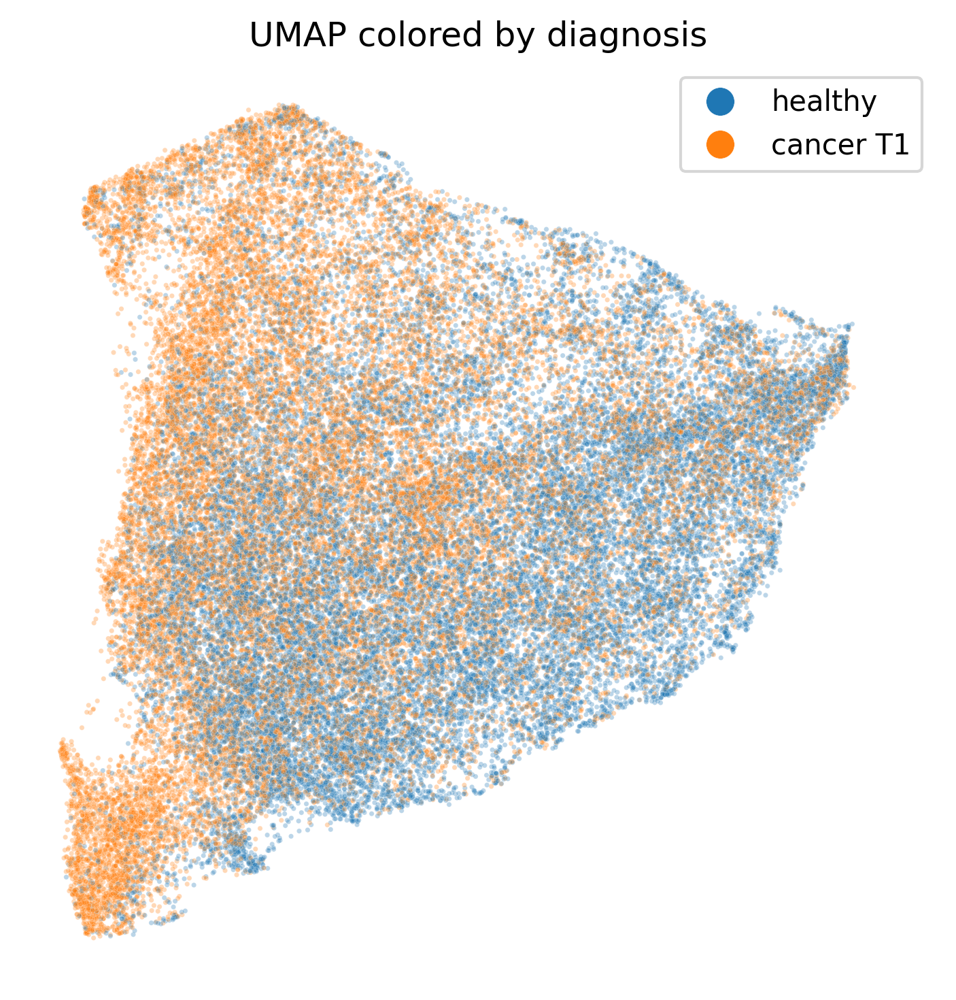

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=300)
m = 'diagnosis'
g = sns.scatterplot(data=df, x='umap_x', y='umap_y', hue=m, s=3, alpha=0.3, ax=ax, hue_order=ho if m == 'patient' else None)
ax.set_title(f'UMAP colored by {m}')
ax.axis('square')
ax.axis('off')
sns.move_legend(g, 'best', title=None)

for lh in g.legend_.legend_handles: 
    lh.set_alpha(1)
    lh.set_markersize(10)

fig.tight_layout()

### Fig. S1a

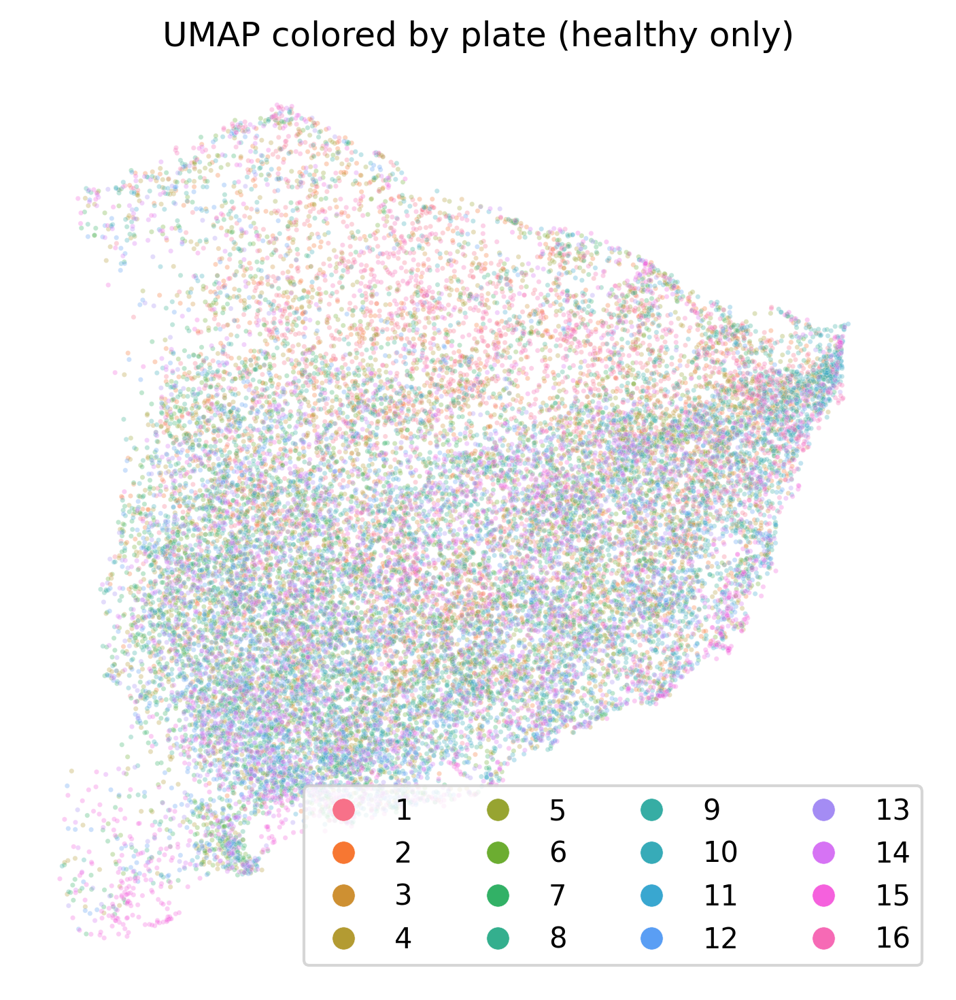

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=300)
m = 'plate healthy'
g = sns.scatterplot(data=df, x='umap_x', y='umap_y', hue=m, s=3, alpha=0.3, ax=ax, hue_order=ho if m == 'patient' else None)
ax.set_title(f'UMAP colored by plate (healthy only)')
ax.axis('square')
ax.axis('off')
sns.move_legend(g, 'best', ncol=4, title=None)

for lh in g.legend_.legend_handles: 
    lh.set_alpha(1)
    lh.set_markersize(8)

fig.tight_layout()

### Fig. S1b

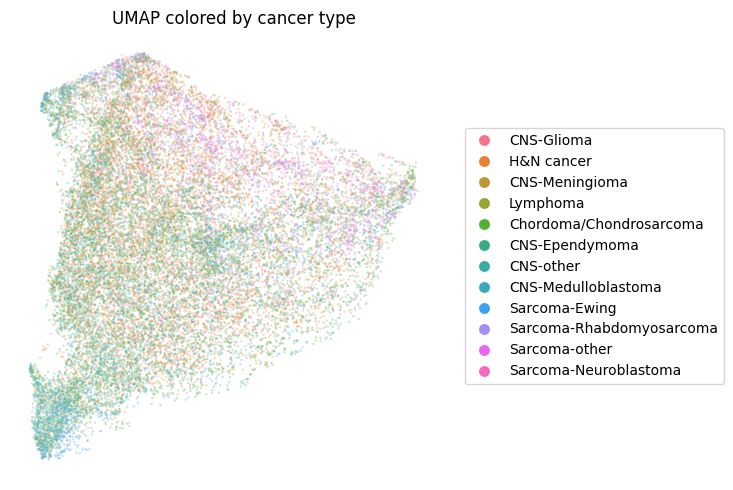

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(9, 5))
m = 'group'
g = sns.scatterplot(data=df, x='umap_x', y='umap_y', hue=m, s=3, alpha=0.3, ax=ax, hue_order=ho if m == 'patient' else None)
ax.set_title(f'UMAP colored by cancer type')
ax.axis('square')
ax.axis('off')
sns.move_legend(g, 'center left', bbox_to_anchor=(1, 0.5), title=None)

for lh in g.legend_.legend_handles: 
    lh.set_alpha(1)
    lh.set_markersize(8)

fig.tight_layout()

## All timepoint UMAPs

In [9]:
from umap.umap_ import UMAP  # python 3.9 issues

df = data.info.copy()
np.random.seed(12412)

for plate in trange(1, 17):
    print('plate', plate, '*' * 80)
    vis_idx_c = []
    pats = df[df['plate'] == plate]['patient'].unique()
    for p in pats:
        if p[0] == 'H':
            continue
        for t in [1, 2, 3, 4, 5]:
            idx = df[(df['patient'] == p) & (df['time'] == t) & (df['plate'] == plate)].index
            if len(idx) > 200:
                vis_idx_c.append(np.random.choice(idx, size=200, replace=False))
    print(len(vis_idx_c))

    vis_idx_h = []
    for p in pats:
        if p[0] == 'P':
            continue
        idx = df[(df['patient'] == p) & (df['time'] <= 1)& (df['plate'] == plate)].index
        if len(idx) > 400:
            vis_idx_h.append(np.random.choice(idx, size=400, replace=False))
    print(len(vis_idx_h))
    vis_idx = np.concatenate(vis_idx_c + vis_idx_h)
    print(len(vis_idx))

    np.random.shuffle(vis_idx)

    feat_umap = UMAP(random_state=123).fit_transform(res_zs[vis_idx])
    print(feat_umap.shape)
    df.loc[vis_idx, ['umap_x', 'umap_y']] = feat_umap

  0%|          | 0/16 [00:00<?, ?it/s]

plate 1 ********************************************************************************


29
5
7800


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


  6%|▋         | 1/16 [00:33<08:25, 33.73s/it]

(7800, 2)
plate 2 ********************************************************************************


39
4
9400


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 12%|█▎        | 2/16 [00:49<05:28, 23.43s/it]

(9400, 2)
plate 3 ********************************************************************************


24
1
5200


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 19%|█▉        | 3/16 [00:59<03:44, 17.27s/it]

(5200, 2)
plate 4 ********************************************************************************


42
4
10000


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 25%|██▌       | 4/16 [01:16<03:26, 17.20s/it]

(10000, 2)
plate 5 ********************************************************************************


22
2
5200


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 31%|███▏      | 5/16 [01:26<02:40, 14.56s/it]

(5200, 2)
plate 6 ********************************************************************************


42
4
10000


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 38%|███▊      | 6/16 [01:44<02:35, 15.53s/it]

(10000, 2)
plate 7 ********************************************************************************


44
4
10400


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 44%|████▍     | 7/16 [01:53<02:00, 13.35s/it]

(10400, 2)
plate 8 ********************************************************************************


39
4
9400


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 50%|█████     | 8/16 [02:09<01:55, 14.39s/it]

(9400, 2)
plate 9 ********************************************************************************


35
4
8600


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 56%|█████▋    | 9/16 [02:24<01:42, 14.65s/it]

(8600, 2)
plate 10 ********************************************************************************


40
4
9600


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 62%|██████▎   | 10/16 [02:41<01:31, 15.27s/it]

(9600, 2)
plate 11 ********************************************************************************


30
2
6800


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 69%|██████▉   | 11/16 [02:53<01:11, 14.37s/it]

(6800, 2)
plate 12 ********************************************************************************


44
4
10400


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 75%|███████▌  | 12/16 [03:03<00:51, 12.77s/it]

(10400, 2)
plate 13 ********************************************************************************


44
4
10400


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 81%|████████▏ | 13/16 [03:11<00:34, 11.60s/it]

(10400, 2)
plate 14 ********************************************************************************


41
4
9800


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 88%|████████▊ | 14/16 [03:29<00:26, 13.26s/it]

(9800, 2)
plate 15 ********************************************************************************


40
3
9200


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


 94%|█████████▍| 15/16 [03:45<00:14, 14.22s/it]

(9200, 2)
plate 16 ********************************************************************************


28
3
6800


/ewsc/hschluet/conda_stuff/anaconda3/envs/new-img-39/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


100%|██████████| 16/16 [03:57<00:00, 13.58s/it]

100%|██████████| 16/16 [03:57<00:00, 14.85s/it]

(6800, 2)


### Fig. S1c

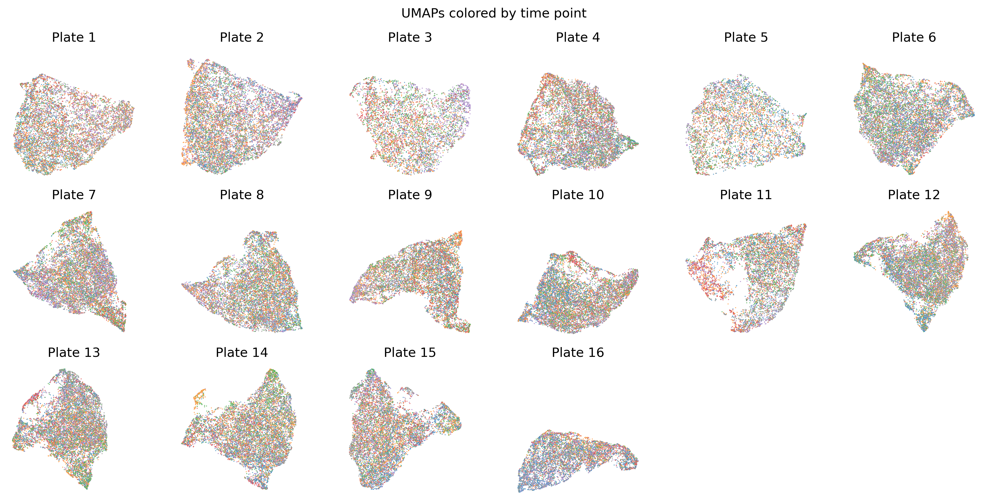

In [10]:
fig, axs = plt.subplots(3, 6, figsize=(2.2*6, 2.2*3), dpi=300)

for plate, ax in zip(range(1, 17), axs.flatten()):
    g = sns.scatterplot(data=df[df['plate'] == plate], x='umap_x', y='umap_y', hue='time', s=1, alpha=0.7, ax=ax, 
                        palette={0 : '#7d7f7c', 1 : '#1f77b4', 2 : '#ff7f0e', 3 : '#2ca02c', 4 : '#d62728', 5 : '#9467bd'})
    ax.set_title(f'Plate {plate}')
    ax.axis('square')
    ax.axis('off')
    # sns.move_legend(g, 'best', title=None, markerscale=5)
    ax.get_legend().remove()

axs.flatten()[-1].axis('off')
axs.flatten()[-2].axis('off')
fig.suptitle('UMAPs colored by time point')
fig.tight_layout()

### Fig. S1d

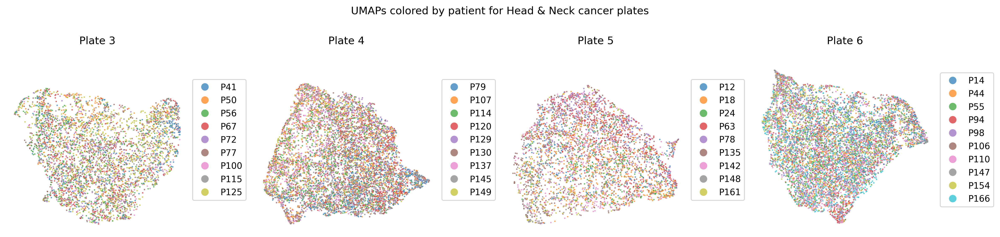

In [11]:
fig, axs = plt.subplots(1, 4, figsize=(4*4, 4), dpi=300)


for plate, ax in zip([3, 4, 5, 6], axs.flatten()):
    ho = df[(df['plate'] == plate) & (df['time'] >= 1)]['patient'].unique()
    pids = [int(p[1:]) + 1000 * (p[0] == 'H') for p in ho]
    ho = ho[np.argsort(pids)]

    g = sns.scatterplot(data=df[(df['plate'] == plate) & (df['time'] >= 1)], x='umap_x', y='umap_y', hue='patient', s=3, alpha=0.7, ax=ax, 
                        hue_order=ho)
    ax.set_title(f'Plate {plate}')
    ax.axis('square')
    ax.axis('off')
    # sns.move_legend(g, 'best', title=None, markerscale=5)
    sns.move_legend(g, 'center left', bbox_to_anchor=(1, 0.5), title=None, markerscale=5)
    # ax.get_legend().remove()

    fig.suptitle('UMAPs colored by patient for Head & Neck cancer plates')
    fig.tight_layout()